In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mstats
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, validation_curve, TimeSeriesSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import pickle
import os
import yfinance as yf
import pandas_datareader as pdr
import dtaidistance as dtw
from dtaidistance import clustering
from tslearn.clustering import TimeSeriesKMeans
import datetime as dt

numpy.ndarray size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject


In [43]:
yf.pdr_override()
sp500 = pdr.get_data_yahoo('SPY', start='2011-01-03', end='2022-10-28')
sp500

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-01-03,127.599998,125.699997,126.709999,127.050003,138725200.0,101.573616
2011-01-04,127.370003,126.190002,127.330002,126.980003,137409700.0,101.517670
2011-01-05,127.720001,126.459999,126.580002,127.639999,133975300.0,102.045280
2011-01-06,127.830002,127.010002,127.690002,127.389999,122519000.0,101.845428
2011-01-07,127.769997,126.150002,127.559998,127.139999,156034600.0,101.645584
...,...,...,...,...,...,...
2022-10-24,380.059998,373.109985,375.890015,378.869995,85436900.0,378.869995
2022-10-25,385.250000,378.670013,378.790009,384.920013,78846300.0,384.920013
2022-10-26,387.579987,381.350006,381.619995,382.019989,104087300.0,382.019989


In [44]:
sp500_test = sp500.loc[sp500.index >= '2016-01-01', :]
sp500_test['return'] = np.log(sp500_test.Close/sp500_test.Close.shift(1))
sp500_test['cumreturn'] = sp500_test['return'].cumsum().apply(np.exp)
sp500_test.fillna(1, inplace=True)
sp500_test

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\3121877641.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_test['return'] = np.log(sp500_test.Close/sp500_test.Close.shift(1))
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\3121877641.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_test['cumreturn'] = sp500_test['return'].cumsum().apply(np.exp)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\3121877641.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

,High,Low,Open,Close,Volume,Adj Close,return,cumreturn
Date,,,,,,,,
2016-01-04,201.029999,198.589996,200.490005,201.020004,222353500.0,178.051285,1.000000,1.000000
2016-01-05,201.899994,200.050003,201.399994,201.360001,110845800.0,178.352417,0.001690,1.001691
2016-01-06,200.059998,197.600006,198.339996,198.820007,152112600.0,176.102692,-0.012694,0.989056
2016-01-07,197.440002,193.589996,195.330002,194.050003,213436100.0,171.877701,-0.024284,0.965327
2016-01-08,195.850006,191.580002,195.190002,191.919998,209817200.0,169.991074,-0.011037,0.954731
...,...,...,...,...,...,...,...,...
2022-10-24,380.059998,373.109985,375.890015,378.869995,85436900.0,378.869995,0.012162,1.884738
2022-10-25,385.250000,378.670013,378.790009,384.920013,78846300.0,384.920013,0.015842,1.914834
2022-10-26,387.579987,381.350006,381.619995,382.019989,104087300.0,382.019989,-0.007563,1.900408


In [2]:
df = pd.read_csv(f"{os.path.dirname(os.getcwd())}\SP500 stock TI extended.csv", header=0, index_col=0, parse_dates=[0])
data = df.copy()
data

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,avg_slow_down,RS_fast,RS_slow,RSI_fast,RSI_slow,RSI_ratio,fast_Ewm,slow_Ewm,MACD,RC
Date,,,,,,,,,,,,,,,,,,,,,
2003-06-02,13.590844,13.683834,13.268956,13.397711,11.463510,6300926.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,13.397711,13.397711,0.000000,NaN
2003-06-03,13.397711,13.648069,13.319027,13.626609,11.659362,4041758.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,13.474010,13.426323,0.047687,NaN
2003-06-04,13.590844,14.270386,13.583691,14.241774,12.185717,2874568.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,13.729931,13.528254,0.201677,NaN
2003-06-05,14.127325,14.163090,13.762518,14.055794,12.026588,4139758.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,13.838552,13.594197,0.244355,NaN
2003-06-06,14.127325,14.234621,13.733906,13.812589,11.818497,4395452.0,A,Health Care,13.826895,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,13.829898,13.621496,0.208402,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-24,48.320000,50.049999,48.130001,49.779999,49.377518,2713000.0,ZION,Financials,49.186000,50.460667,...,0.757333,0.567010,0.786092,36.184186,44.011828,0.822147,49.164700,50.414698,-1.249998,-0.046543
2022-10-25,47.720001,51.869999,47.490002,51.509998,51.093529,3797100.0,ZION,Financials,49.092000,50.260000,...,0.757333,0.903093,0.735035,47.453947,42.364276,1.120141,49.946466,50.551611,-0.605144,-0.055209
2022-10-26,51.040001,51.939999,50.349998,50.400002,49.992508,1623000.0,ZION,Financials,49.328000,50.052000,...,0.764666,1.368750,0.727986,57.783649,42.129164,1.371583,50.097645,50.532659,-0.435015,-0.058296


In [3]:
data['return'] = data.groupby('symbol').Close.transform(lambda x: np.log(x/x.shift(1)))
data

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,RS_fast,RS_slow,RSI_fast,RSI_slow,RSI_ratio,fast_Ewm,slow_Ewm,MACD,RC,return
Date,,,,,,,,,,,,,,,,,,,,,
2003-06-02,13.590844,13.683834,13.268956,13.397711,11.463510,6300926.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.397711,13.397711,0.000000,NaN,NaN
2003-06-03,13.397711,13.648069,13.319027,13.626609,11.659362,4041758.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.474010,13.426323,0.047687,NaN,0.016941
2003-06-04,13.590844,14.270386,13.583691,14.241774,12.185717,2874568.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.729931,13.528254,0.201677,NaN,0.044155
2003-06-05,14.127325,14.163090,13.762518,14.055794,12.026588,4139758.0,A,Health Care,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.838552,13.594197,0.244355,NaN,-0.013145
2003-06-06,14.127325,14.234621,13.733906,13.812589,11.818497,4395452.0,A,Health Care,13.826895,NaN,...,NaN,NaN,NaN,NaN,NaN,13.829898,13.621496,0.208402,NaN,-0.017454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-24,48.320000,50.049999,48.130001,49.779999,49.377518,2713000.0,ZION,Financials,49.186000,50.460667,...,0.567010,0.786092,36.184186,44.011828,0.822147,49.164700,50.414698,-1.249998,-0.046543,0.040169
2022-10-25,47.720001,51.869999,47.490002,51.509998,51.093529,3797100.0,ZION,Financials,49.092000,50.260000,...,0.903093,0.735035,47.453947,42.364276,1.120141,49.946466,50.551611,-0.605144,-0.055209,0.034163
2022-10-26,51.040001,51.939999,50.349998,50.400002,49.992508,1623000.0,ZION,Financials,49.328000,50.052000,...,1.368750,0.727986,57.783649,42.129164,1.371583,50.097645,50.532659,-0.435015,-0.058296,-0.021785


In [4]:
indicators = ['SMA_ratio','SMA_volume_ratio','ATR_ratio','ADX_fast','ADX_slow','Stochastic_Ratio','RSI_ratio','MACD','RC', 'return']

In [6]:
train_dic = {}
test_dic = {}
test_ext_dic = {}

lag = 7
for ticker in data.symbol.unique():
    temp = data.loc[data.symbol==ticker, :]
    for regressor in indicators:
        for i in range(1, lag):
            temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
    train = temp.loc[(temp.index >= '2011-01-01') & (temp.index < '2016-01-01'), :]
    test = temp.loc[(temp.index >= '2016-01-01') & (temp.index < '2021-01-01'), :]
    test_ext = temp.loc[temp.index >= '2016-01-01', :]
    
    dfs = [train, test, test_ext]
    dics = [train_dic, test_dic, test_ext_dic]
    
    for i in range(len(dfs)):
        df, dic = dfs[i], dics[i]
        df.loc[:, 'Close_shifted'] = df.loc[:, 'Close'].shift(-6)
        df.loc[:, 'Target'] = ((df.Close_shifted-df.Open)/df.Open).shift(-1)
        df.loc[:, 'Target_direction'] = np.where(df.Target > 0, 1, 0)
        dic[ticker] = df

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'Close_shifted'] = df.loc[:, 'Close'].shift(-6)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'Target'] = ((df.Close_shifted-df.Open)/df.Open).shift(-1)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp[f'{regressor}_{i}'] = temp[f'{regressor}'].shift(i)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\2784114987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

In [7]:
# with open('train_dic.pkl', 'wb') as f:
#     pickle.dump(train_dic, f)
    
# with open('test_dic.pkl', 'wb') as f:
#     pickle.dump(test_dic, f)
    
# with open('test_ext_dic.pkl', 'wb') as f:
#     pickle.dump(test_ext_dic, f)

In [12]:
with open('train_dic.pkl', 'rb') as f:
    train_dic = pickle.load(f)
    
with open('test_dic.pkl', 'rb') as f:
    test_dic = pickle.load(f)
    
with open('test_ext_dic.pkl', 'rb') as f:
    test_ext_dic = pickle.load(f)

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,RC_3,RC_4,RC_5,RC_6,return_1,return_2,return_3,return_4,return_5,return_6
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,29.728184,30.143063,29.620888,29.957083,27.204121,4994075.0,A,Health Care,29.771101,29.087744,...,0.086220,0.086220,0.086220,0.086220,-0.003854,-0.002402,0.004327,-0.009829,0.020485,0.000243
2011-01-04,30.035765,30.114449,29.456366,29.678112,26.950787,5017282.0,A,Health Care,29.768240,29.220791,...,0.086220,0.086220,0.086220,0.086220,0.010803,-0.003854,-0.002402,0.004327,-0.009829,0.020485
2011-01-05,29.513592,29.849785,29.327612,29.613733,26.892324,4519035.0,A,Health Care,29.726752,29.340009,...,0.086220,0.086220,0.086220,0.086220,-0.009356,0.010803,-0.003854,-0.002402,0.004327,-0.009829
2011-01-06,29.592276,29.928469,29.477825,29.670959,26.944286,4699097.0,A,Health Care,29.711016,29.483071,...,0.086220,0.086220,0.086220,0.086220,-0.002172,-0.009356,0.010803,-0.003854,-0.002402,0.004327
2011-01-07,29.699572,29.899857,29.356222,29.771103,27.035231,3810948.0,A,Health Care,29.738198,29.572723,...,0.072093,0.086220,0.086220,0.086220,0.001931,-0.002172,-0.009356,0.010803,-0.003854,-0.002402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-24,134.119995,134.550003,133.479996,133.889999,133.889999,1367500.0,BRK-B,Financials,132.379999,133.188002,...,-0.021627,-0.037882,-0.008584,0.002509,0.007557,0.014755,0.012734,-0.033703,-0.014156,0.007387
2015-12-28,133.479996,133.539993,132.520004,133.119995,133.119995,2382900.0,BRK-B,Financials,133.097998,132.964001,...,-0.024115,-0.021627,-0.037882,-0.008584,-0.001940,0.007557,0.014755,0.012734,-0.033703,-0.014156
2015-12-29,134.000000,134.550003,133.000000,134.139999,134.139999,3135400.0,BRK-B,Financials,133.687997,132.866668,...,-0.008280,-0.024115,-0.021627,-0.037882,-0.005768,-0.001940,0.007557,0.014755,0.012734,-0.033703


In [8]:
train_df = pd.concat(train_dic.values())
train_df

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,RC_6,return_1,return_2,return_3,return_4,return_5,return_6,Close_shifted,Target,Target_direction
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,29.728184,30.143063,29.620888,29.957083,27.204119,4994075.0,A,Health Care,29.771101,29.087744,...,0.118464,-0.003854,-0.002402,0.004327,-0.009829,0.020485,0.000243,30.715307,0.027149,1
2011-01-04,30.035765,30.114449,29.456366,29.678112,26.950787,5017282.0,A,Health Care,29.768240,29.220791,...,0.118463,0.010803,-0.003854,-0.002402,0.004327,-0.009829,0.020485,30.851215,0.041444,1
2011-01-05,29.513592,29.849785,29.327612,29.613733,26.892321,4519035.0,A,Health Care,29.726752,29.340009,...,0.117964,-0.009356,0.010803,-0.003854,-0.002402,0.004327,-0.009829,30.736767,0.045685,1
2011-01-06,29.592276,29.928469,29.477825,29.670959,26.944290,4699097.0,A,Health Care,29.711016,29.483071,...,0.109367,-0.002172,-0.009356,0.010803,-0.003854,-0.002402,0.004327,30.944206,0.068160,1
2011-01-07,29.699572,29.899857,29.356222,29.771103,27.035227,3810948.0,A,Health Care,29.738198,29.572723,...,0.104355,0.001931,-0.002172,-0.009356,0.010803,-0.003854,-0.002402,31.723890,0.024632,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-24,27.629999,28.010000,27.590000,27.780001,23.748335,857100.0,ZION,Financials,27.218000,27.825334,...,-0.058097,0.018603,0.014463,0.002244,-0.038558,-0.016080,0.010691,NaN,NaN,0
2015-12-28,27.629999,27.690001,27.200001,27.639999,23.628653,1476700.0,ZION,Financials,27.404000,27.655333,...,-0.072812,0.003968,0.018603,0.014463,0.002244,-0.038558,-0.016080,NaN,NaN,0
2015-12-29,27.879999,28.049999,27.590000,27.809999,23.773983,1659000.0,ZION,Financials,27.612000,27.581333,...,-0.112330,-0.005052,0.003968,0.018603,0.014463,0.002244,-0.038558,NaN,NaN,0


In [10]:
ticker_wide = train_df.loc[:, ['symbol', 'return']]
ticker_wide.loc[:, 'Date'] = ticker_wide.index
ticker_wide = ticker_wide.pivot(index='Date', columns='symbol', values='return')
ticker_wide

symbol,A,AAP,AAPL,ABC,ABMD,ABT,ACGL,ACN,ADBE,ADI,...,WTW,WY,WYNN,XEL,XOM,XRAY,YUM,ZBH,ZBRA,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,0.010803,-0.009875,0.021500,0.005845,0.019578,-0.001880,0.004985,0.002060,0.016433,0.007406,...,0.015189,0.042912,0.048405,0.000425,0.019368,0.026853,0.000815,0.023747,0.005513,0.038061
2011-01-04,-0.009356,-0.051052,0.005205,-0.011134,0.000000,0.009366,-0.006235,-0.006607,0.007006,-0.011395,...,-0.016923,-0.010684,0.030719,0.004236,0.004684,-0.011173,-0.015396,-0.013369,-0.009469,-0.016423
2011-01-05,-0.002172,0.001284,0.008147,0.015205,0.023198,0.000000,0.001477,0.000207,0.022282,0.002130,...,0.013789,0.030725,0.012819,-0.005935,-0.002674,0.009462,0.004747,0.000737,-0.001058,0.005638
2011-01-06,0.001931,-0.033448,-0.000809,0.011541,0.001992,-0.002074,-0.013604,0.003721,0.001551,0.005570,...,0.002849,-0.006969,0.007265,-0.000851,0.006405,-0.005724,0.006976,-0.031440,-0.008502,-0.002815
2011-01-07,0.003369,0.026363,0.007136,0.002006,-0.016048,0.004143,-0.007626,0.001650,-0.007153,-0.005836,...,-0.001708,0.027102,0.034794,0.008896,0.005439,-0.004026,0.012395,-0.000190,0.003197,-0.010526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-24,0.008819,0.000470,-0.005355,0.000096,0.023296,0.000000,0.002412,-0.001821,-0.004233,0.005650,...,0.003416,0.003260,0.003186,-0.003073,-0.010782,-0.002132,-0.001620,0.001361,-0.002114,0.003968
2015-12-28,-0.008580,0.009477,-0.011264,0.002306,-0.015170,-0.001553,0.005371,-0.001440,-0.001061,-0.006181,...,0.002767,-0.004895,-0.012072,0.011130,-0.007465,0.004913,-0.002165,-0.006434,-0.011067,-0.005052
2015-12-29,0.013787,0.010900,0.017815,0.005551,0.042471,0.017392,0.004220,0.011843,0.011924,0.015120,...,0.044480,0.001308,0.025713,0.002211,0.005320,0.011371,0.005403,0.005073,0.002565,0.006132


In [11]:
ticker_wideT = ticker_wide.transpose().fillna(0)
ticker_wideT

Date,2011-01-03,2011-01-04,2011-01-05,2011-01-06,2011-01-07,2011-01-10,2011-01-11,2011-01-12,2011-01-13,2011-01-14,...,2015-12-17,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-28,2015-12-29,2015-12-30,2015-12-31
symbol,,,,,,,,,,,,,,,,,,,,,
A,0.010803,-0.009356,-0.002172,0.001931,0.003369,0.014313,0.016910,0.004415,-0.003717,0.006726,...,-0.015814,-0.016815,0.018041,0.009506,0.013255,0.008819,-0.008580,0.013787,-0.004496,-0.008573
AAP,-0.009875,-0.051052,0.001284,-0.033448,0.026363,0.007406,-0.005953,0.013305,0.003021,0.003012,...,-0.049390,-0.023131,0.000535,-0.012236,0.008286,0.000470,0.009477,0.010900,-0.005270,-0.005896
AAPL,0.021500,0.005205,0.008147,-0.000809,0.007136,0.018657,-0.002368,0.008104,0.003652,0.008067,...,-0.021424,-0.027442,0.012186,-0.000932,0.012787,-0.005355,-0.011264,0.017815,-0.013145,-0.019382
ABC,0.005845,-0.011134,0.015205,0.011541,0.002006,-0.005742,0.009742,-0.006006,0.014807,0.001412,...,0.007355,-0.004505,0.009865,0.002621,0.007533,0.000096,0.002306,0.005551,0.002383,-0.012552
ABMD,0.019578,0.000000,0.023198,0.001992,-0.016048,0.013059,0.006962,0.014757,0.004871,-0.005848,...,-0.010104,0.022278,0.008186,-0.007273,0.006480,0.023296,-0.015170,0.042471,-0.007678,-0.020176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XRAY,0.026853,-0.011173,0.009462,-0.005724,-0.004026,0.010321,0.007388,0.026817,0.000551,-0.000275,...,-0.003148,-0.010510,0.007019,0.008787,0.007565,-0.002132,0.004913,0.011371,-0.008109,-0.009161
YUM,0.000815,-0.015396,0.004747,0.006976,0.012395,0.001413,-0.006474,-0.002439,-0.005100,-0.021915,...,-0.018389,-0.004999,0.021482,-0.005465,0.015226,-0.001620,-0.002165,0.005403,-0.005809,-0.010350
ZBH,0.023747,-0.013369,0.000737,-0.031440,-0.000190,0.007766,0.035039,0.014649,-0.004679,0.005935,...,-0.012041,-0.017529,0.012752,0.014855,0.010171,0.001361,-0.006434,0.005073,-0.002923,0.001170


In [12]:
dtw_mat = dtw.dtw.distance_matrix_fast(ticker_wideT.to_numpy(), parallel=True)
dtw_mat

DTAIDistance C-extension for Numpy is not available. Proceeding anyway.


array([[0.        , 0.54697371, 0.47626401, ..., 0.4397631 , 0.53279631,
        0.43318627],
       [0.54697371, 0.        , 0.47256833, ..., 0.4641299 , 0.50651283,
        0.53195625],
       [0.47626401, 0.47256833, 0.        , ..., 0.40076627, 0.51581135,
        0.47650343],
       ...,
       [0.4397631 , 0.4641299 , 0.40076627, ..., 0.        , 0.49358024,
        0.44545306],
       [0.53279631, 0.50651283, 0.51581135, ..., 0.49358024, 0.        ,
        0.52844487],
       [0.43318627, 0.53195625, 0.47650343, ..., 0.44545306, 0.52844487,
        0.        ]])

In [13]:
with open('dtw_mat.pkl', 'wb') as f:
    pickle.dump(dtw_mat, f)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished


0.378 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished


0.218 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished


0.218 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Do

0.311 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.208 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.207 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.206 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.206 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 786 out of 786 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      

0.304 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.208 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.205 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.205 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.205 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.204 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.204 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.204 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.204 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1179 out of 1179 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12

0.303 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished


0.207 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished


0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.204 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.204 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.4s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.4s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.203 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished


0.203 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapse

0.278 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished


0.203 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.202 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.201 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.200 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished


0.200 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished


0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished


0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished


0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished


0.199 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elaps

0.276 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.5s finished


0.201 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.5s finished


0.200 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.199 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.199 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.5s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.6s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.198 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.198 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.5s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.6s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.198 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2358 out of 2358 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Paralle

0.270 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.5s finished


0.197 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.195 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished


0.194 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.5s finished


0.194 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.5s finished


0.193 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished


0.193 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.5s finished


0.193 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.193 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished


0.193 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2751 out of 2751 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elap

0.264 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.192 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.8s finished


0.191 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.190 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.7s finished


0.190 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.7s finished


0.190 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s


0.190 --> 


[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3144 out of 3144 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parall

0.261 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.8s finished


0.187 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.186 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.9s finished


0.186 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.186 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.186 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Paral

0.258 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.185 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    0.9s finished


0.184 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.184 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.184 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.184 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3930 out of 3930 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Paral

0.256 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    1.0s finished


0.183 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    1.3s finished


0.182 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.181 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    0.9s finished


0.181 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    1.2s finished


0.181 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4323 out of 4323 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Para

0.254 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    1.1s finished


0.182 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    1.2s finished


0.180 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    0.9s finished


0.180 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    0.9s finished


0.180 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s


0.180 --> 


[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Para

0.252 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.0s finished


0.180 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.1s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.178 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.0s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.178 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.178 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.178 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5109 out of 5109 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: U

0.235 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.180 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.179 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.4s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.178 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.178 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.2s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished


0.178 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.178 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.178 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5502 out of 5502 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Par

0.230 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.175 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished


0.175 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.174 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.174 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.174 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished


0.174 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished


0.174 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.174 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.4s finished


0.174 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished


0.174 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished


0.174 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.174 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s


0.174 --> 


[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 5895 out of 5895 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.2s finished


0.228 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.5s finished


0.173 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.8s finished


0.173 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.4s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.4s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.4s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.5s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.5s finished


0.172 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6288 out of 6288 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 668

0.226 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.3s finished


0.172 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.5s finished


0.171 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.3s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.6s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.5s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.5s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.3s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.4s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.3s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.4s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.3s finished


0.170 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.4s finished


0.170 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6681 out of 6681 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Paral

0.223 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.4s finished


0.169 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.168 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.4s finished


0.168 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.168 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.168 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.168 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished


0.168 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.168 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.168 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.168 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.168 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.168 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7074 out of 7074 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: 

[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.2s fini

0.221 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.5s finished


0.167 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.6s finished


0.166 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.5s finished


0.164 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.7s finished


0.164 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.8s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.6s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.6s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.5s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.6s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.7s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    2.1s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.9s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.6s finished


0.163 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7467 out of 7467 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Paral

0.219 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.8s finished


0.165 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.8s finished


0.163 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    2.2s finished


0.162 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.7s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.8s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.9s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.6s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.8s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    2.4s finished


0.161 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7860 out of 7860 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.232 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.165 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    1.7s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.160 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    1.7s finished


0.160 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n

0.160 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.160 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.160 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8253 out of 8253 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.230 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.8s finished


0.164 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.9s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.8s finished


0.160 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.8s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    2.0s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.9s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.8s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.9s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.9s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using b

0.159 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8646 out of 8646 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  2

[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Par

0.228 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    1.9s finished


0.162 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.0s finished


0.159 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    1.8s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    1.9s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.0s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    1.9s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.3s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.0s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    1.9s finished


0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.1s finished


0.158 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9039 out of 9039 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using b

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.227 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.1s finished


0.161 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using b

0.158 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.157 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.1s finished


0.157 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.0s finished


0.157 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.1s finished


0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.0s finished


0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using b

0.156 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    1.9s finished


0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.0s finished


0.156 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9432 out of 9432 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using b

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.226 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9825 out of 

0.161 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBac

0.158 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBac

0.157 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.2s finished


0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9825 out of 

0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 9825 out of 

0.156 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBac

0.155 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.155 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBac

0.155 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  

0.155 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9825 out of 9825 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  

[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Par

0.222 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.160 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.157 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.156 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.155 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.155 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.155 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.154 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.154 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 10218 out of

0.154 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10218 out of

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.219 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.158 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.155 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.154 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 10611 out of

0.152 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 10611 out of

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

0.218 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.6s finished


0.157 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11004 out of

0.154 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingB

0.153 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingB

0.152 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.152 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.152 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.3s finished


0.151 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11004 out of

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.3s finished


0.151 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11004 out of

0.151 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

0.151 --> 

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


0.151 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11004 out of 11004 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11397 out of 11397 | elapsed:    2.4s finished


0.216 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.155 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.152 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.151 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11397 out of 11397 | elapsed: 

0.150 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11790 out of 11790 | elapsed: 

0.214 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.153 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.151 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.149 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_job

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.213 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.153 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed: 

0.150 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.149 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed: 

0.147 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed: 

0.147 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed:    2.9s finished


0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed: 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 12183 out of 12183 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend Threadin

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Par

0.212 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed: 

0.152 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed: 

0.149 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed: 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend Threadin

0.146 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed: 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend Threadin

0.146 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend Threadin

0.146 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12576 out of 12576 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend Threadin

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: U

0.211 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.151 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.209 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.149 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.208 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 13755 out of 13755 | elapsed

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 13755 out of 13755 | elapsed

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: U

0.208 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.148 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.143 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14148 out of 14148 | elapsed

0.142 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14148 out of 14148 | elapsed

0.142 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 14148 out of 14148 | elapsed

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.207 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.147 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.142 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.206 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.146 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.144 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.205 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.145 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.142 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.141 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.141 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: U

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

0.202 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.140 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.140 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.140 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.140 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.139 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.139 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.201 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.143 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.140 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.140 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.139 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.139 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

0.199 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.141 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.140 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 16176 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 16899 out of 16899 | elapsed:    3.7s finished


0.198 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.140 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.137 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 16176 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 17292 out of 17292 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


0.197 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.140 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.137 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.137 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Para

[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 16176 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 17685 out of 17685 | ela

0.195 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.139 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.137 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.136 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.136 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.136 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.136 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.136 --> 


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 602

0.195 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.138 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.136 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.136 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.135 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.135 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.135 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.135 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

0.194 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.137 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.136 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.136 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

0.192 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.134 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.134 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.133 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.133 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.133 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.133 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.133 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.190 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.135 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.134 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.134 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.133 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.133 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.133 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.133 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.132 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.132 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.132 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Para

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1965 out of 1965 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Par

0.188 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.134 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.133 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.133 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.132 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.132 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.132 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.132 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 11226 tasks 

0.131 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.131 --> 

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   

0.131 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.131 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.131 --> 

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

0.131 --> 


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11226 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 14426 tasks      | elapsed: 

,Difference in SS
1,NaN
2,-0.012431
3,-0.001677
4,-0.001251
5,-0.003837
6,-0.001729
7,-0.004741
8,-0.002465
9,-0.004789
10,-0.002019


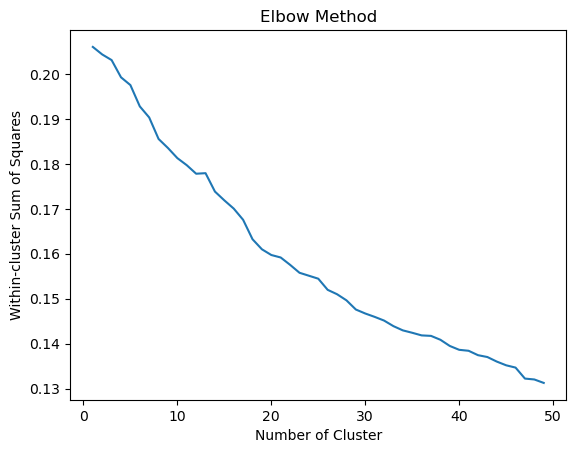

In [14]:
kmax = 50
sum_of_sq_dtw = np.zeros([kmax, 1])
for k in range(1, kmax+1):
    sum_of_sq_dtw[k-1] = TimeSeriesKMeans(n_clusters=k,
                                         max_iter_barycenter=5,
                                         metric='dtw',
                                         n_jobs=-1,
                                         random_state=0,
                                         verbose=1).fit(np.expand_dims(ticker_wideT, axis=1)).inertia_
    
plt.plot(range(1, kmax), sum_of_sq_dtw[1:kmax])
plt.title("Elbow Method") 
plt.xlabel("Number of Cluster") 
plt.ylabel("Within-cluster Sum of Squares")

pd.DataFrame(sum_of_sq_dtw, columns = ['Difference in SS'], index = range(1,kmax+1)).diff()

In [15]:
# Get 9 clusters
dtw_clusters = 9
dtw_model = TimeSeriesKMeans(n_clusters=dtw_clusters,
                            max_iter_barycenter=5,
                            metric='dtw',
                            n_jobs=-1,
                            random_state=0,
                            verbose=1).fit_predict(np.expand_dims(ticker_wideT, axis=1))
dtw_model_df = pd.DataFrame({'dtw_cluster': dtw_model,
                            'symbol': ticker_wideT.index})

# Sort by clusters
dtw_model_df = dtw_model_df.sort_values(['dtw_cluster']).reset_index(drop=True)
dtw_model_df

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 393 out of 393 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1572 out of 1572 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapse

0.261 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    1.0s finished


0.187 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished


0.186 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished


0.186 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished


0.186 --> 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.7s finished


0.186 --> 


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3537 out of 3537 | elapsed:    0.8s finished


,dtw_cluster,symbol
0,0,MAR
1,0,HST
2,1,ILMN
3,1,INCY
4,1,CI
...,...,...
388,8,HAL
389,8,HES
390,8,PXD
391,8,APA


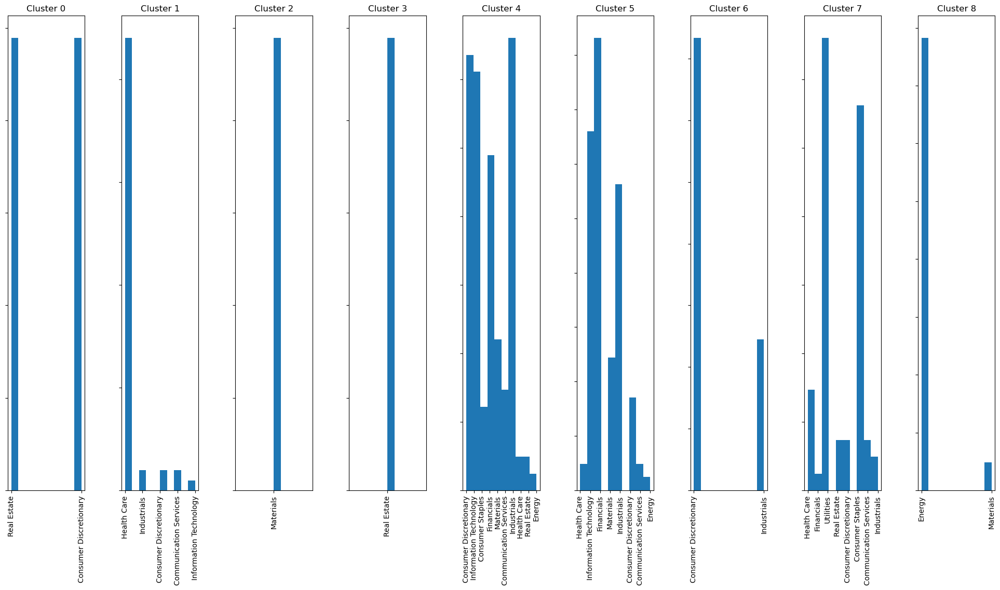

In [16]:
fig, ax = plt.subplots(1, dtw_clusters, figsize=(20,10))
fig.tight_layout(pad=2)
for i in range(dtw_clusters):
    cluster = dtw_model_df[dtw_model_df.dtw_cluster==i]
    companies = cluster.symbol.unique()
    industry = data[data.symbol.isin(companies)]
    ax[i].hist(industry['industry'])
    ax[i].set_title('Cluster {}'.format(i))
    ax[i].tick_params(rotation=90, labelleft=False)

In [17]:
ind_merged = dtw_model_df.merge(data[['symbol', 'industry']].drop_duplicates(), on='symbol', how='left')
ind_merged

,dtw_cluster,symbol,industry
0,0,MAR,Consumer Discretionary
1,0,HST,Real Estate
2,1,ILMN,Health Care
3,1,INCY,Health Care
4,1,CI,Health Care
...,...,...,...
388,8,HAL,Energy
389,8,HES,Energy
390,8,PXD,Energy
391,8,APA,Energy


In [18]:
# One-hot encode industry 
encoder = OneHotEncoder()
sparse = encoder.fit_transform(ind_merged['industry'].values.reshape(-1, 1))
ind_onehot_merged = ind_merged.merge(pd.DataFrame.sparse.from_spmatrix(sparse, columns=encoder.categories_[0]), 
                                     how='left', left_index=True, right_index=True)
ind_onehot_merged

,dtw_cluster,symbol,industry,Communication Services,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,Materials,Real Estate,Utilities
0,0,MAR,Consumer Discretionary,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,HST,Real Estate,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,ILMN,Health Care,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,1,INCY,Health Care,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,1,CI,Health Care,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,8,HAL,Energy,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
389,8,HES,Energy,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
390,8,PXD,Energy,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
391,8,APA,Energy,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
ind_cluster_df = ind_onehot_merged[['dtw_cluster', 'symbol'] + list(encoder.categories_[0])].copy()
ind_cluster_df

# Pivot df such that index is symbol, columns are industries
ind_wide_list = []
for cluster in ind_cluster_df.dtw_cluster.unique():
    ind_cluster_df_filtered = ind_cluster_df[ind_cluster_df.dtw_cluster == cluster]
    ind_wide = ind_cluster_df_filtered.drop(['dtw_cluster'], axis=1).set_index('symbol')
    ind_wide_list.append(ind_wide)

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\1191994099.py:9: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  sum_of_sq.append(KMeans(n_clusters=k, random_state=0).fit(ind_wide_list[i]).inertia_)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\1191994099.py:9: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  sum_of_sq.append(KMeans(n_clusters=k, random_state=0).fit(ind_wide_list[i]).inertia_)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\1191994099.py:9: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  sum_of_sq.append(KMeans(n_clusters=k, random_state=0).fit(ind_wide_list[i]).inertia_)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\1191994099.py:9: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (9). Pos

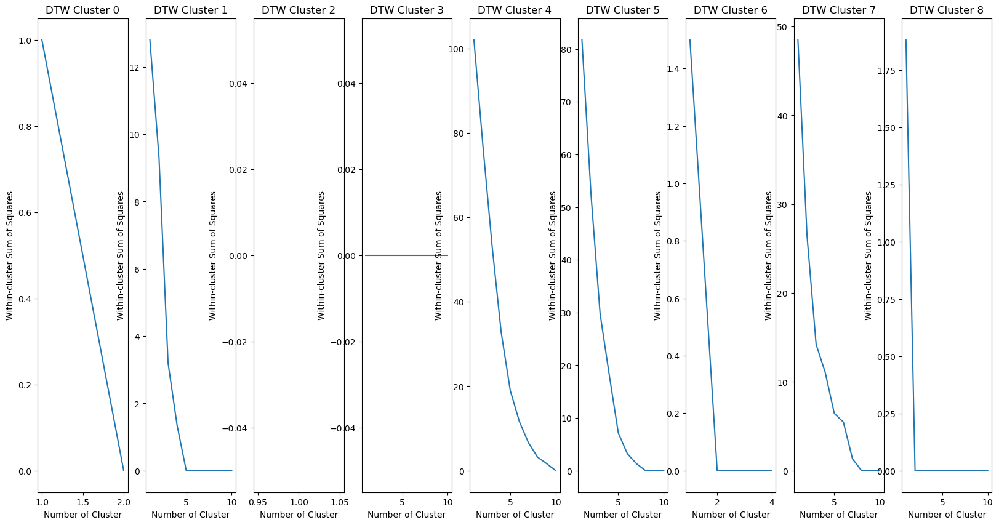

In [20]:
kmax_ind = 10
sum_of_sq_ind_diff = []
fig, ax = plt.subplots(1, dtw_clusters, figsize=(20,10))
for i in range(dtw_clusters):
    sum_of_sq = []
    n_samples = len(dtw_model_df[dtw_model_df.dtw_cluster==i])
    kmax_ind_temp = kmax_ind if n_samples >= kmax_ind else n_samples
    for k in range(1, kmax_ind_temp+1):
        sum_of_sq.append(KMeans(n_clusters=k, random_state=0).fit(ind_wide_list[i]).inertia_)
    ax[i].plot(range(1, kmax_ind_temp+1), sum_of_sq)
    ax[i].set_title("DTW Cluster {}".format(i)) 
    ax[i].set_xlabel(xlabel="Number of Cluster")
    ax[i].set_ylabel(ylabel="Within-cluster Sum of Squares")

    sum_of_sq_ind_diff.append(pd.DataFrame(sum_of_sq, 
                                           columns = ['Difference in SS'], index = range(1,kmax_ind_temp+1)).diff())

In [21]:
for i in range(len(sum_of_sq_ind_diff)):
    print('Cluster {}'.format(i))
    print(sum_of_sq_ind_diff[i])

Cluster 0
   Difference in SS
1               NaN
2              -1.0
Cluster 1
    Difference in SS
1                NaN
2          -3.487692
3          -6.120000
4          -1.866667
5          -1.333333
6           0.000000
7           0.000000
8           0.000000
9           0.000000
10          0.000000
Cluster 2
   Difference in SS
1               NaN
Cluster 3
    Difference in SS
1                NaN
2                0.0
3                0.0
4                0.0
5                0.0
6                0.0
7                0.0
8                0.0
9                0.0
10               0.0
Cluster 4
    Difference in SS
1                NaN
2         -25.307927
3         -23.508333
4         -20.444444
5         -13.795556
6          -7.335000
7          -5.025000
8          -3.400000
9          -1.533333
10         -1.666667
Cluster 5
    Difference in SS
1                NaN
2         -29.402516
3         -22.600000
4         -11.504762
5         -11.061905
6          -3.966667


In [22]:
ind_num_clusters = [2, 5, 1, 1, 6, 5, 2, 3, 2]
ind_cluster_list = []
for i in range(len(ind_num_clusters)):
    n_samples = len(ind_wide_list[i])
    if n_samples > 1:
        ind_gmm = GaussianMixture(n_components=ind_num_clusters[i], random_state=0)
        ind_clusters_pred = ind_gmm.fit_predict(ind_wide_list[i].sparse.to_dense())
        ind_clusters_pred_df = pd.DataFrame({'Ind cluster': ind_clusters_pred,
                                            'symbol': ind_wide_list[i].index})
    else:
        ind_clusters_pred_df = pd.DataFrame({'Ind cluster': 'NA',
                                            'symbol': ind_wide_list[i].index})
    ind_cluster_list.append(ind_clusters_pred_df)
ind_clusters_pred_df = pd.concat(ind_cluster_list, ignore_index=True)
ind_clusters_pred_df

C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


,Ind cluster,symbol
0,0,MAR
1,1,HST
2,0,ILMN
3,0,INCY
4,0,CI
...,...,...
388,0,HAL
389,0,HES
390,0,PXD
391,0,APA


In [23]:
comb_clusters = dtw_model_df.merge(ind_clusters_pred_df, on='symbol', how='left')
comb_clusters['comb cluster'] = comb_clusters['dtw_cluster'].astype(str) + " " + comb_clusters['Ind cluster'].astype(str)
comb_clusters

,dtw_cluster,symbol,Ind cluster,comb cluster
0,0,MAR,0,0 0
1,0,HST,1,0 1
2,1,ILMN,0,1 0
3,1,INCY,0,1 0
4,1,CI,0,1 0
...,...,...,...,...
388,8,HAL,0,8 0
389,8,HES,0,8 0
390,8,PXD,0,8 0
391,8,APA,0,8 0


In [24]:
comb_clusters.to_csv('comb cluster.csv')

In [25]:
regressors_lagged = []
for regressor in indicators:
    regressors_lagged.append(regressor)
    for i in range(1, lag):
        regressors_lagged.append(f'{regressor}_{i}')

In [27]:
len(comb_clusters['comb cluster'].unique())

27

In [30]:
# Run the loop for every 27 unique cluster 
for cluster in comb_clusters['comb cluster'].unique():
    
    print('The current cluster running is: {}'.format(cluster))
    
    # Get data for that cluster
    symbols = comb_clusters.loc[comb_clusters['comb cluster']==cluster, 'symbol']
    train_cluster = train_df.loc[(train_df.symbol.isin(symbols)) & (~train_df.index.isin(train_df.index.unique()[-lag:])), :]
    x_train_cluster = train_cluster.loc[:, regressors_lagged].fillna(0)
    y_train_cluster = train_cluster.loc[:, ['Target_direction']]

    # Define parameters from Validation Curve
    params = {'max_depth': [8, 9, 10],
          'max_features': ['sqrt', 'auto'],
          'min_samples_leaf': [10, 15, 20],
          'n_estimators': [20, 25, 30],
         'min_samples_split':[5, 10, 15]} 

    rf = RandomForestClassifier()

    # Cross validation using TimeSeriesSplit
    time_series_split = TimeSeriesSplit(n_splits=3)

    
    rf_cv = RandomizedSearchCV(rf, params, cv=time_series_split, n_jobs=-1, verbose=20)

    #Fit the random forest with our X_train and Y_train
    rf_cv.fit(x_train_cluster, y_train_cluster)
          
    #Save the fited variable into a Pickle file
    file_loc = f'{os.getcwd()}\DTW_RF_models\Cluster_{cluster}' 
    pickle.dump(rf_cv, open(file_loc,'wb'))

The current cluster running is: 0 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 0 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 1 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 1 3
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 1 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 1 4
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 1 2
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 2 NA
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 3 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 2
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 3
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 5
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 4 4
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 5 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 5 3
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 5 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 5 2
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 5 4
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 6 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 6 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 7 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 7 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 7 2
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 8 0
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


The current cluster running is: 8 1
Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\kmlee\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [31]:
def get_pnl(x):
    if x['position'].sum() > 0:
        return ((x['Target'])*x['position']).sum()/port_size + 1
    return 1

In [32]:
def merge_preds(original_df, preds_df):
    merged_preds_df = preds_df.sort_values(['symbol', 'Date'])
    merged_preds_df.loc[:, ['Target', 'Target_direction']] = original_df.loc[:, ['Target', 'Target_direction']]
    merged_preds_df.drop(['Date'], axis=1, inplace=True)
    merged_preds_df.index.rename('Date', inplace=True)
    return merged_preds_df

In [33]:
def strategy_return(merged_preds_df):
    strategies = pd.DataFrame()
    strategies['avg return'] = merged_preds_df.groupby('Date').apply(get_pnl).shift(7).fillna(1)
    strategies['strategy'] = np.log(strategies['avg return'])
    strategies['cumstrategy'] = strategies['strategy'].cumsum().apply(np.exp)
    return strategies

In [34]:
def plot_returns(benchmark, strategy, title):
    plt.figure(figsize=(20, 12))
    plt.plot(pd.to_datetime(strategy.index).date, strategy.cumstrategy, label='Model')
    plt.plot(benchmark.index, benchmark['cumreturn'], color='red', label='SP500 Buy & Hold')
    plt.title(title)
    plt.gca().grid(True)
    plt.legend()

In [35]:
test_df = pd.concat(test_dic.values())
test_df

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,RC_6,return_1,return_2,return_3,return_4,return_5,return_6,Close_shifted,Target,Target_direction
Date,,,,,,,,,,,,,,,,,,,,,
2016-01-04,41.060001,41.189999,40.340000,40.689999,38.468800,3287300.0,A,Health Care,41.762000,41.222000,...,0.033399,-0.008573,-0.004496,0.013787,-0.008580,0.008819,0.013255,38.189999,-0.095016,0
2016-01-05,40.730000,40.950001,40.340000,40.549999,38.336441,2587200.0,A,Health Care,41.516000,41.246000,...,0.049564,-0.027153,-0.008573,-0.004496,0.013787,-0.008580,0.008819,36.860001,-0.065358,0
2016-01-06,40.240002,40.990002,40.049999,40.730000,38.506618,2103600.0,A,Health Care,41.189999,41.278000,...,0.016545,-0.003447,-0.027153,-0.008573,-0.004496,0.013787,-0.008580,37.610001,-0.075486,0
2016-01-07,40.139999,40.150002,38.810001,39.000000,36.871056,3504300.0,A,Health Care,40.556000,41.157333,...,0.040786,0.004429,-0.003447,-0.027153,-0.008573,-0.004496,0.013787,37.110001,-0.051504,0
2016-01-08,39.220001,39.709999,38.470001,38.590000,36.483425,3736700.0,A,Health Care,39.912000,40.968000,...,0.024290,-0.043403,0.004429,-0.003447,-0.027153,-0.008573,-0.004496,37.200001,-0.037458,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24,43.619999,43.619999,42.660000,43.340000,41.128952,327700.0,ZION,Financials,42.480000,42.359333,...,0.000239,0.034369,-0.009234,0.032334,-0.019048,0.000000,0.006229,NaN,NaN,0
2020-12-28,43.660000,44.139999,43.259998,43.360001,41.147926,835600.0,ZION,Financials,42.936000,42.315333,...,0.022466,-0.003915,0.034369,-0.009234,0.032334,-0.019048,0.000000,NaN,NaN,0
2020-12-29,43.389999,43.389999,42.619999,42.770000,40.588032,1084100.0,ZION,Financials,43.004000,42.306000,...,0.041054,0.000461,-0.003915,0.034369,-0.009234,0.032334,-0.019048,NaN,NaN,0


In [38]:
# Make predictions for each cluster in test data
preds_df_list = []
port_size = 20

for i in range(len(test_df.index.unique())):
    test_date = test_df.loc[test_df.index==test_df.index.unique()[i], :]
    curr_day_pred = pd.DataFrame({'Date': [],
                                 'symbol': [],
                                 'prediction': []})
    for cluster in comb_clusters['comb cluster'].unique():
        symbols = comb_clusters.loc[comb_clusters['comb cluster']==cluster, 'symbol']
        test_date_cluster = test_date.loc[test_date.symbol.isin(symbols), :]
        rf_cv = pickle.load(open(f'{os.getcwd()}\DTW_RF_models\Cluster_{cluster}', 'rb'))
        best_rf = rf_cv.best_estimator_
        x_test = test_date_cluster.loc[:, regressors_lagged].fillna(0)
        curr_day_pred = pd.concat([curr_day_pred, pd.DataFrame({'Date': test_date_cluster.index,
                                                          'symbol': test_date_cluster.symbol,
                                                          'prediction': best_rf.predict_proba(x_test)[:,1]})
                                  ])
    # Top 20 companies with highest chance to go long
    top_df = curr_day_pred.sort_values(by=['prediction'], ascending=False).head(port_size)
    if i%lag==0:
        curr_day_pred['position'] = np.where(curr_day_pred['symbol'].isin(top_df['symbol']),1, 0)
    else:
        curr_day_pred['position'] = np.array([0]*len(curr_day_pred))
    preds_df_list.append(curr_day_pred)

In [39]:
preds_df = pd.concat(preds_df_list)
preds_df

,Date,symbol,prediction,position
2016-01-04,2016-01-04,MAR,0.604865,0
2016-01-04,2016-01-04,HST,0.433490,0
2016-01-04,2016-01-04,ABC,0.583597,0
2016-01-04,2016-01-04,ABMD,0.561532,0
2016-01-04,2016-01-04,ALGN,0.570554,0
...,...,...,...,...
2020-12-31,2020-12-31,OXY,0.509638,0
2020-12-31,2020-12-31,PXD,0.508055,0
2020-12-31,2020-12-31,SLB,0.504956,0
2020-12-31,2020-12-31,WMB,0.549309,0


In [48]:
preds_df.to_csv('preds_df.csv')

In [40]:
test_preds = merge_preds(test_df, preds_df)
test_preds

,symbol,prediction,position,Target,Target_direction
Date,,,,,
2016-01-04,A,0.579604,0,-0.095016,0
2016-01-05,A,0.542943,0,-0.065358,0
2016-01-06,A,0.562494,0,-0.075486,0
2016-01-07,A,0.523048,0,-0.051504,0
2016-01-08,A,0.528552,0,-0.037458,0
...,...,...,...,...,...
2020-12-24,ZION,0.587409,0,NaN,0
2020-12-28,ZION,0.616904,0,NaN,0
2020-12-29,ZION,0.588696,0,NaN,0


In [41]:
test_strategies = strategy_return(test_preds)
test_strategies

,avg return,strategy,cumstrategy
Date,,,
2016-01-04,1.0,0.0,1.000000
2016-01-05,1.0,0.0,1.000000
2016-01-06,1.0,0.0,1.000000
2016-01-07,1.0,0.0,1.000000
2016-01-08,1.0,0.0,1.000000
...,...,...,...
2020-12-24,1.0,0.0,2.616421
2020-12-28,1.0,0.0,2.616421
2020-12-29,1.0,0.0,2.616421


In [42]:
hits = np.where((test_preds['Target_direction'] == test_preds['position']) & 
                (test_preds['position'] == 1) &
                (test_preds['Target'].isnull() == False), 1, 0)
np.sum(hits)/len(test_preds[(test_preds.Target.isnull()==False)&(test_preds.position==1)])*100

55.92178770949721

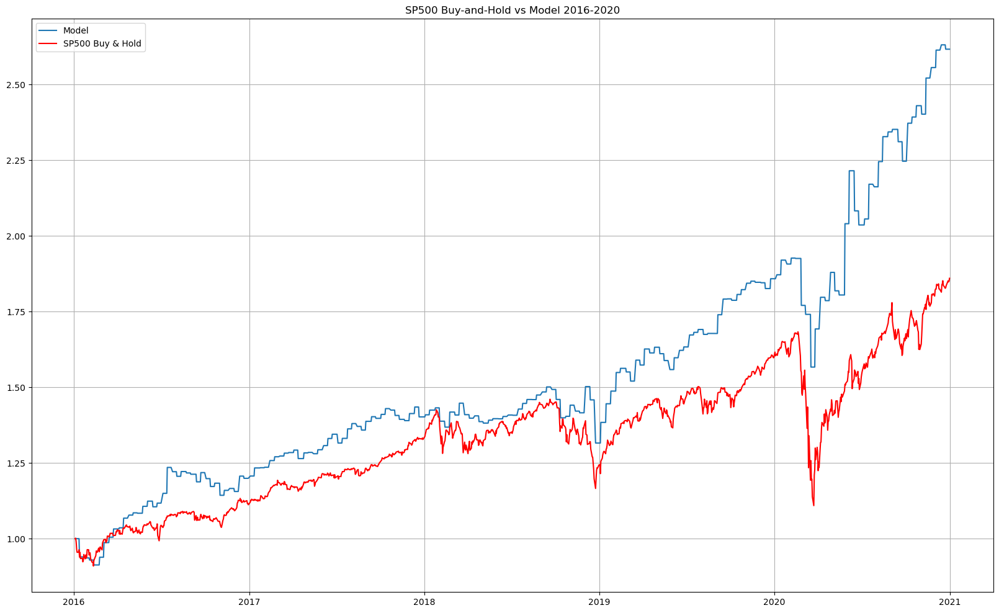

In [45]:
plot_returns(sp500_test.loc[sp500_test.index < '2021-01-01', :], test_strategies, 'SP500 Buy-and-Hold vs Model 2016-2020')

In [46]:
sp500_weekly = sp500_test.loc[sp500_test.index < '2021-01-01', :]
sp500_weekly['Close shifted'] = sp500_weekly.Close.shift(-6)
sp500_weekly['Target'] = ((sp500_weekly['Close shifted']-sp500_weekly.Open)/sp500_weekly.Open).shift(-1)
sp500_weekly_return = []
for i in range(len(sp500_weekly)):
    if i%lag == 0:
        sp500_weekly_return.append(sp500_weekly.iloc[i]['Target'])
    else:
        sp500_weekly_return.append(0)
temp_df = pd.DataFrame({'return': sp500_weekly_return}).shift(7)
temp_df =  temp_df.loc[temp_df['return'] != 0, 'return'].dropna()
sp500_sharpe = temp_df.mean()/temp_df.std()
sp500_sharpe

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\24998602.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_weekly['Close shifted'] = sp500_weekly.Close.shift(-6)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\24998602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_weekly['Target'] = ((sp500_weekly['Close shifted']-sp500_weekly.Open)/sp500_weekly.Open).shift(-1)


0.16723321200780666

In [47]:
strategy_weekly_return = test_strategies.loc[test_strategies['avg return'] != 1, 'avg return'] - 1
strategy_sharpe = strategy_weekly_return.mean()/strategy_weekly_return.std()
strategy_sharpe

0.20838627948181895

In [50]:
test_ext_df = pd.concat(test_ext_dic.values())
test_ext_df_cut = test_ext_df.loc[test_ext_df.index >= '2021-01-01', :]
test_ext_df_cut

,Open,High,Low,Close,Adj Close,Volume,symbol,industry,SMA_fast,SMA_slow,...,RC_6,return_1,return_2,return_3,return_4,return_5,return_6,Close_shifted,Target,Target_direction
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-04,118.940002,120.089996,117.110001,118.639999,117.405220,2030700.0,A,Health Care,117.916000,117.830667,...,0.023828,0.009327,0.001364,-0.005105,0.004423,0.000085,-0.000597,126.970001,0.071742,1
2021-01-05,118.480003,120.320000,118.070000,119.610001,118.365112,2344000.0,A,Health Care,118.272000,117.906000,...,0.032840,0.001265,0.009327,0.001364,-0.005105,0.004423,0.000085,126.980003,0.061842,1
2021-01-06,118.690002,123.879997,118.209999,122.889999,121.611000,2428500.0,A,Health Care,119.403999,118.316000,...,0.023274,0.008143,0.001265,0.009327,0.001364,-0.005105,0.004423,126.029999,0.015121,1
2021-01-07,124.330002,127.480003,124.110001,126.160004,124.846962,1775900.0,A,Health Care,121.158000,118.900667,...,0.024738,0.027053,0.008143,0.001265,0.009327,0.001364,-0.005105,126.209999,0.006799,1
2021-01-08,126.489998,127.639999,125.849998,127.059998,125.737587,1577200.0,A,Health Care,122.872000,119.555334,...,0.003248,0.026261,0.027053,0.008143,0.001265,0.009327,0.001364,127.349998,0.013128,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-24,48.320000,50.049999,48.130001,49.779999,49.377518,2713000.0,ZION,Financials,49.186000,50.460667,...,-0.080338,0.014534,-0.043390,-0.054559,0.001926,0.034114,-0.008539,NaN,NaN,0
2022-10-25,47.720001,51.869999,47.490002,51.509998,51.093529,3797100.0,ZION,Financials,49.092000,50.260000,...,-0.030824,0.040169,0.014534,-0.043390,-0.054559,0.001926,0.034114,NaN,NaN,0
2022-10-26,51.040001,51.939999,50.349998,50.400002,49.992508,1623000.0,ZION,Financials,49.328000,50.052000,...,-0.014784,0.034163,0.040169,0.014534,-0.043390,-0.054559,0.001926,NaN,NaN,0


In [51]:
# Make predictions for each cluster in test data
preds_df_list = []

for i in range(len(test_ext_df_cut.index.unique())):
    test_date = test_ext_df_cut.loc[test_ext_df_cut.index==test_ext_df_cut.index.unique()[i], :]
    index = list(test_ext_df.index.unique()).index(test_ext_df_cut.index.unique()[i])
    curr_day_pred = pd.DataFrame({'Date': [],
                                 'symbol': [],
                                 'prediction': []})
    for cluster in comb_clusters['comb cluster'].unique():
        symbols = comb_clusters.loc[comb_clusters['comb cluster']==cluster, 'symbol']
        test_date_cluster = test_date.loc[test_date.symbol.isin(symbols), :]
        rf_cv = pickle.load(open(f'{os.getcwd()}\DTW_RF_models\Cluster_{cluster}', 'rb'))
        best_rf = rf_cv.best_estimator_
        x_test = test_date_cluster.loc[:, regressors_lagged].fillna(0)
        curr_day_pred = pd.concat([curr_day_pred, pd.DataFrame({'Date': test_date_cluster.index,
                                                          'symbol': test_date_cluster.symbol,
                                                          'prediction': best_rf.predict_proba(x_test)[:,1]})
                                  ])
    # Top 20 companies with highest chance to go long
    top_df = curr_day_pred.sort_values(by=['prediction'], ascending=False).head(port_size)
    if index%lag==0:
        curr_day_pred['position'] = np.where(curr_day_pred['symbol'].isin(top_df['symbol']),1, 0)
    else:
        curr_day_pred['position'] = np.array([0]*len(curr_day_pred))
    preds_df_list.append(curr_day_pred)

In [53]:
preds_ext_df = pd.concat(preds_df_list)
preds_ext_df = pd.concat([preds_df, preds_ext_df])
preds_ext_df

,Date,symbol,prediction,position
2016-01-04,2016-01-04,MAR,0.604865,0
2016-01-04,2016-01-04,HST,0.433490,0
2016-01-04,2016-01-04,ABC,0.583597,0
2016-01-04,2016-01-04,ABMD,0.561532,0
2016-01-04,2016-01-04,ALGN,0.570554,0
...,...,...,...,...
2022-10-28,2022-10-28,OXY,0.506429,0
2022-10-28,2022-10-28,PXD,0.489598,0
2022-10-28,2022-10-28,SLB,0.470832,0
2022-10-28,2022-10-28,WMB,0.595399,0


In [54]:
test_ext_preds = merge_preds(test_ext_df, preds_ext_df)
test_ext_preds

,symbol,prediction,position,Target,Target_direction
Date,,,,,
2016-01-04,A,0.579604,0,-0.095016,0
2016-01-05,A,0.542943,0,-0.065358,0
2016-01-06,A,0.562494,0,-0.075486,0
2016-01-07,A,0.523048,0,-0.051504,0
2016-01-08,A,0.528552,0,-0.037458,0
...,...,...,...,...,...
2022-10-24,ZION,0.674489,0,NaN,0
2022-10-25,ZION,0.620858,0,NaN,0
2022-10-26,ZION,0.691756,0,NaN,0


In [56]:
test_ext_strategy = strategy_return(test_ext_preds)
test_ext_strategy

,avg return,strategy,cumstrategy
Date,,,
2016-01-04,1.00000,0.000000,1.000000
2016-01-05,1.00000,0.000000,1.000000
2016-01-06,1.00000,0.000000,1.000000
2016-01-07,1.00000,0.000000,1.000000
2016-01-08,1.00000,0.000000,1.000000
...,...,...,...
2022-10-24,1.00000,0.000000,2.850228
2022-10-25,1.05055,0.049314,2.994306
2022-10-26,1.00000,0.000000,2.994306


In [57]:
hits = np.where((test_ext_preds['Target_direction'] == test_ext_preds['position']) & 
                (test_ext_preds['position'] == 1) &
                (test_ext_preds['Target'].isnull() == False), 1, 0)
np.sum(hits)/len(test_ext_preds[(test_ext_preds.Target.isnull()==False)&(test_ext_preds.position==1)])*100

55.3469387755102

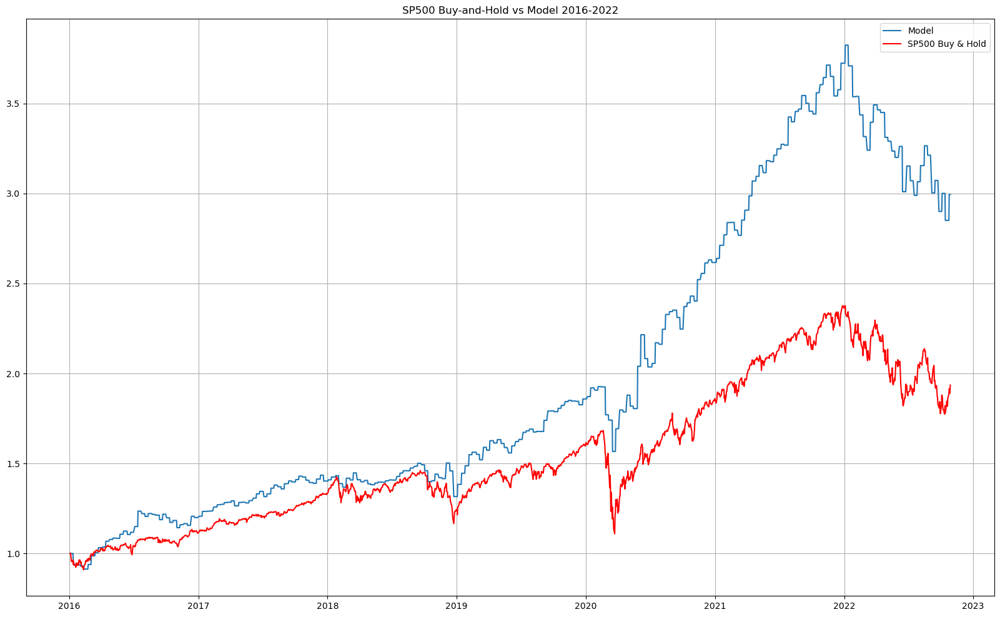

In [60]:
plot_returns(sp500_test, test_ext_strategy, 'SP500 Buy-and-Hold vs Model 2016-2022')

In [61]:
sp500_weekly = sp500_test
sp500_weekly['Close shifted'] = sp500_weekly.Close.shift(-6)
sp500_weekly['Target'] = ((sp500_weekly['Close shifted']-sp500_weekly.Open)/sp500_weekly.Open).shift(-1)
sp500_weekly_return = []
for i in range(len(sp500_weekly)):
    if i%lag == 0:
        sp500_weekly_return.append(sp500_weekly.iloc[i]['Target'])
    else:
        sp500_weekly_return.append(0)
temp_df = pd.DataFrame({'return': sp500_weekly_return}).shift(7)
temp_df =  temp_df.loc[temp_df['return'] != 0, 'return'].dropna()
sp500_sharpe = temp_df.mean()/temp_df.std()
sp500_sharpe

C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\3790693759.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_weekly['Close shifted'] = sp500_weekly.Close.shift(-6)
C:\Users\kmlee\AppData\Local\Temp\ipykernel_27112\3790693759.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp500_weekly['Target'] = ((sp500_weekly['Close shifted']-sp500_weekly.Open)/sp500_weekly.Open).shift(-1)


0.13379370617302544

In [62]:
strategy_weekly_return = test_ext_strategy.loc[test_ext_strategy['avg return'] != 1, 'avg return'] - 1
strategy_sharpe = strategy_weekly_return.mean()/strategy_weekly_return.std()
strategy_sharpe

0.1747301938435267